In [3]:
# Librerias
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from seaborn import distplot
import folium # libreria para generacion de mapa
from folium.plugins import HeatMap


In [4]:
# Ruta de la carpeta que contiene los archivos JSON
ruta_datos = "C:/Users/54280/Documents/GitHub/proyectogrupal/Pruebas/metadata-sitios"

# Lista para almacenar los DataFrames de datos JSON
data_frames = []

# Itero sobre los archivos JSON en la carpeta
for filename in os.listdir(ruta_datos):
    if filename.endswith(".json"):
        file_path = os.path.join(ruta_datos, filename)
        # Leo el archivo JSON y creo un DataFrame
        with open(file_path, 'r', encoding='utf-8') as file:
            data = pd.read_json(file, lines=True)
        data_frames.append(data)

# Combino todos los DataFrames de datos JSON en uno
df_gmaps = pd.concat(data_frames, ignore_index=True)

In [5]:
# Veo el df que acabo de generar 
df_gmaps.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3025011 entries, 0 to 3025010
Data columns (total 15 columns):
 #   Column            Dtype  
---  ------            -----  
 0   name              object 
 1   address           object 
 2   gmap_id           object 
 3   description       object 
 4   latitude          float64
 5   longitude         float64
 6   category          object 
 7   avg_rating        float64
 8   num_of_reviews    int64  
 9   price             object 
 10  hours             object 
 11  MISC              object 
 12  state             object 
 13  relative_results  object 
 14  url               object 
dtypes: float64(3), int64(1), object(11)
memory usage: 346.2+ MB


In [6]:
df_gmaps.head(5)

,name,address,gmap_id,description,latitude,longitude,category,avg_rating,num_of_reviews,price,hours,MISC,state,relative_results,url
0,Porter Pharmacy,"Porter Pharmacy, 129 N Second St, Cochran, GA ...",0x88f16e41928ff687:0x883dad4fd048e8f8,None,32.388300,-83.357100,[Pharmacy],4.9,16,None,"[[Friday, 8AM–6PM], [Saturday, 8AM–12PM], [Sun...","{'Service options': ['In-store shopping', 'Sam...",Open ⋅ Closes 6PM,"[0x88f16e41929435cf:0x5b2532a2885e9ef6, 0x88f1...",https://www.google.com/maps/place//data=!4m2!3...
1,City Textile,"City Textile, 3001 E Pico Blvd, Los Angeles, C...",0x80c2c98c0e3c16fd:0x29ec8a728764fdf9,None,34.018891,-118.215290,[Textile exporter],4.5,6,None,None,None,Open now,"[0x80c2c624136ea88b:0xb0315367ed448771, 0x80c2...",https://www.google.com/maps/place//data=!4m2!3...
2,San Soo Dang,"San Soo Dang, 761 S Vermont Ave, Los Angeles, ...",0x80c2c778e3b73d33:0xbdc58662a4a97d49,None,34.058092,-118.292130,[Korean restaurant],4.4,18,None,"[[Thursday, 6:30AM–6PM], [Friday, 6:30AM–6PM],...","{'Service options': ['Takeout', 'Dine-in', 'De...",Open ⋅ Closes 6PM,"[0x80c2c78249aba68f:0x35bf16ce61be751d, 0x80c2...",https://www.google.com/maps/place//data=!4m2!3...
3,Nova Fabrics,"Nova Fabrics, 2200 E 11th St, Los Angeles, CA ...",0x80c2c89923b27a41:0x32041559418d447,None,34.023669,-118.232930,[Fabric store],3.3,6,None,"[[Thursday, 9AM–5PM], [Friday, 9AM–5PM], [Satu...","{'Service options': ['In-store shopping'], 'Pa...",Open ⋅ Closes 5PM,"[0x80c2c8811477253f:0x23a8a492df1918f7, 0x80c2...",https://www.google.com/maps/place//data=!4m2!3...
4,Nobel Textile Co,"Nobel Textile Co, 719 E 9th St, Los Angeles, C...",0x80c2c632f933b073:0xc31785961fe826a6,None,34.036694,-118.249421,[Fabric store],4.3,7,None,"[[Thursday, 9AM–5PM], [Friday, 9AM–5PM], [Satu...",{'Service options': ['In-store pickup']},Open ⋅ Closes 5PM,"[0x80c2c62c496083d1:0xdefa11317fe870a1, 0x80c2...",https://www.google.com/maps/place//data=!4m2!3...


In [5]:
# Saco la lista que compone category y la dejo como texto para explorarla
df_exploded = df_gmaps.explode('category')

In [6]:
# Genero una variable que contenga los valores unicos de category
categorias_unicas = df_exploded['category'].unique()

In [7]:
# La nueva variables es un array paso a convertirla en un df
categorias_unicas

array(['Pharmacy', 'Textile exporter', 'Korean restaurant', ...,
       'Pipe manufacturer', 'Staircase', 'Frituur'], dtype=object)

In [8]:
#Convierto Category en un df
df_categorias = pd.DataFrame({'Category': categorias_unicas})

In [9]:
# Exploro el df de category
df_categorias 

,Category
0,Pharmacy
1,Textile exporter
2,Korean restaurant
3,Fabric store
4,Restaurant
...,...
4467,State Department Agriculture Food Supply
4468,Karma dealer
4469,Pipe manufacturer
4470,Staircase


In [10]:
# Exporto df category para verlo completo
df_categorias.to_csv('categorias_nuevas.csv')

Voy a limpiar el df que contiene todo los registros con el uso de un listado de palabras clave para dejar solo los datos de la category que nos interesa

In [11]:
# Lista de palabras clave
palabras_clave = ["restaurant", "food", "cafe", "diner", "bakery", "lunch", "brunch"]

# Combino palabras clave en un patrón de búsqueda con '|'
patron_busqueda = '|'.join(palabras_clave)

# Eliminar registros con valores faltantes en la columna "category"
df_exploded = df_exploded.dropna(subset=['category'])

# Convertir la columna "category" a minúsculas y eliminar espacios en blanco
df_exploded['category'] = df_exploded['category'].str.lower().str.strip()

# Filtrar los registros que contienen cualquier parte de las palabras clave en la columna "category"
df_filtrado = df_exploded[df_exploded['category'].str.contains(patron_busqueda, case=False)]

In [12]:
df_filtrado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 441868 entries, 2 to 3025006
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   name              441868 non-null  object 
 1   address           439290 non-null  object 
 2   gmap_id           441868 non-null  object 
 3   description       197047 non-null  object 
 4   latitude          441868 non-null  float64
 5   longitude         441868 non-null  float64
 6   category          441868 non-null  object 
 7   avg_rating        441868 non-null  float64
 8   num_of_reviews    441868 non-null  int64  
 9   price             244781 non-null  object 
 10  hours             401547 non-null  object 
 11  MISC              436358 non-null  object 
 12  state             402667 non-null  object 
 13  relative_results  371024 non-null  object 
 14  url               441868 non-null  object 
dtypes: float64(3), int64(1), object(11)
memory usage: 53.9+ MB


In [13]:
df_filtrado

,name,address,gmap_id,description,latitude,longitude,category,avg_rating,num_of_reviews,price,hours,MISC,state,relative_results,url
2,San Soo Dang,"San Soo Dang, 761 S Vermont Ave, Los Angeles, ...",0x80c2c778e3b73d33:0xbdc58662a4a97d49,None,34.058092,-118.292130,korean restaurant,4.4,18,None,"[[Thursday, 6:30AM–6PM], [Friday, 6:30AM–6PM],...","{'Service options': ['Takeout', 'Dine-in', 'De...",Open ⋅ Closes 6PM,"[0x80c2c78249aba68f:0x35bf16ce61be751d, 0x80c2...",https://www.google.com/maps/place//data=!4m2!3...
6,Vons Chicken,"Vons Chicken, 12740 La Mirada Blvd, La Mirada,...",0x80dd2b4c8555edb7:0xfc33d65c4bdbef42,None,33.916402,-118.010855,restaurant,4.5,18,None,"[[Thursday, 11AM–9:30PM], [Friday, 11AM–9:30PM...","{'Service options': ['Outdoor seating', 'Curbs...",Open ⋅ Closes 9:30PM,None,https://www.google.com/maps/place//data=!4m2!3...
8,"Sweet Rewards Gluten Free Bakery, LLC","Sweet Rewards Gluten Free Bakery, LLC, 85 NE D...",0x87ec235c54d25b31:0x3b75fb5facc602f,None,41.616079,-93.865487,bakery,4.7,21,None,"[[Thursday, 10AM–5:30PM], [Friday, 10AM–5:30PM...",{'Service options': ['Delivery']},Permanently closed,"[0x87ee974869295555:0x95f310d065882c9b, 0x87ec...",https://www.google.com/maps/place//data=!4m2!3...
8,"Sweet Rewards Gluten Free Bakery, LLC","Sweet Rewards Gluten Free Bakery, LLC, 85 NE D...",0x87ec235c54d25b31:0x3b75fb5facc602f,None,41.616079,-93.865487,health food restaurant,4.7,21,None,"[[Thursday, 10AM–5:30PM], [Friday, 10AM–5:30PM...",{'Service options': ['Delivery']},Permanently closed,"[0x87ee974869295555:0x95f310d065882c9b, 0x87ec...",https://www.google.com/maps/place//data=!4m2!3...
43,Sigman’s Diner,"Sigman’s Diner, 517 Elk St, Gassaway, WV 26624",0x884bdf439ee0d6e3:0x16676d0a5982954d,None,38.672489,-80.774893,diner,4.6,28,None,"[[Thursday, 7AM–2PM], [Friday, 7AM–2PM], [Satu...","{'Service options': ['Takeout', 'Dine-in', 'De...",Permanently closed,[0x884bcf5834725e7d:0x537d8a1a05e15936],https://www.google.com/maps/place//data=!4m2!3...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3025004,Rosa’s Mexican Grill Chandler,"Rosa’s Mexican Grill Chandler, 3002 N Arizona ...",0x872ba99db0ab78db:0x55c826ed8748149d,None,33.351057,-111.842995,mexican restaurant,4.4,88,None,"[[Saturday, 11AM–9PM], [Sunday, Closed], [Mond...","{'Service options': ['Takeout', 'Dine-in'], 'H...",Open ⋅ Closes 9PM,None,https://www.google.com/maps/place//data=!4m2!3...
3025005,Domino's Pizza,"Domino's Pizza, 804 N Federal Blvd, Riverton, ...",0x8758dd6a49d17909:0xbe7ccb53ee53e5a7,Delivery/carryout chain offering a wide range ...,43.031526,-108.381641,delivery restaurant,4.1,178,$,"[[Saturday, 10:30AM–1AM], [Sunday, 10:30AM–12A...","{'Service options': ['Curbside pickup', 'No-co...",Open ⋅ Closes 1AM,"[0x8758dd1d78e34a05:0x18c8d4d86049360c, 0x8758...",https://www.google.com/maps/place//data=!4m2!3...
3025005,Domino's Pizza,"Domino's Pizza, 804 N Federal Blvd, Riverton, ...",0x8758dd6a49d17909:0xbe7ccb53ee53e5a7,Delivery/carryout chain offering a wide range ...,43.031526,-108.381641,takeout restaurant,4.1,178,$,"[[Saturday, 10:30AM–1AM], [Sunday, 10:30AM–12A...","{'Service options': ['Curbside pickup', 'No-co...",Open ⋅ Closes 1AM,"[0x8758dd1d78e34a05:0x18c8d4d86049360c, 0x8758...",https://www.google.com/maps/place//data=!4m2!3...
3025005,Domino's Pizza,"Domino's Pizza, 804 N Federal Blvd, Riverton, ...",0x8758dd6a49d17909:0xbe7ccb53ee53e5a7,Delivery/carryout chain offering a wide range ...,43.031526,-108.381641,pizza restaurant,4.1,178,$,"[[Saturday, 10:30AM–1AM], [Sunday, 10:30AM–12A...","{'Service options': ['Curbside pickup', 'No-co...",Open ⋅ Closes 1AM,"[0x8758dd1d78e34a05:0x18c8d4d86049360c, 0x8758...",https://www.google.com/maps/place//data=!4m2!3...


Antes de arrancar el EDA voy a generar un CSV con los id y name filtrados de las categorias que necesitamos para que puedan utilizarlo el resto del equipo

In [14]:
# Genero un df que contenga el los id y los nombres para que se puedan filtrar las rewiews
df_id_gmaps = df_filtrado[['gmap_id', 'name']]

In [15]:
# Veo como quedo 
df_id_gmaps

,gmap_id,name
2,0x80c2c778e3b73d33:0xbdc58662a4a97d49,San Soo Dang
6,0x80dd2b4c8555edb7:0xfc33d65c4bdbef42,Vons Chicken
8,0x87ec235c54d25b31:0x3b75fb5facc602f,"Sweet Rewards Gluten Free Bakery, LLC"
8,0x87ec235c54d25b31:0x3b75fb5facc602f,"Sweet Rewards Gluten Free Bakery, LLC"
43,0x884bdf439ee0d6e3:0x16676d0a5982954d,Sigman’s Diner
...,...,...
3025004,0x872ba99db0ab78db:0x55c826ed8748149d,Rosa’s Mexican Grill Chandler
3025005,0x8758dd6a49d17909:0xbe7ccb53ee53e5a7,Domino's Pizza
3025005,0x8758dd6a49d17909:0xbe7ccb53ee53e5a7,Domino's Pizza
3025005,0x8758dd6a49d17909:0xbe7ccb53ee53e5a7,Domino's Pizza


In [16]:
# Exporto un df con los id y los name para pasar al grupo que esta trabajando con  las rewiews
df_id_gmaps.to_csv('df_id_gmaps.csv')

Voy a darle formato a las columnas de acuerdo a lo que corresponda

In [17]:
df_filtrado

,name,address,gmap_id,description,latitude,longitude,category,avg_rating,num_of_reviews,price,hours,MISC,state,relative_results,url
2,San Soo Dang,"San Soo Dang, 761 S Vermont Ave, Los Angeles, ...",0x80c2c778e3b73d33:0xbdc58662a4a97d49,None,34.058092,-118.292130,korean restaurant,4.4,18,None,"[[Thursday, 6:30AM–6PM], [Friday, 6:30AM–6PM],...","{'Service options': ['Takeout', 'Dine-in', 'De...",Open ⋅ Closes 6PM,"[0x80c2c78249aba68f:0x35bf16ce61be751d, 0x80c2...",https://www.google.com/maps/place//data=!4m2!3...
6,Vons Chicken,"Vons Chicken, 12740 La Mirada Blvd, La Mirada,...",0x80dd2b4c8555edb7:0xfc33d65c4bdbef42,None,33.916402,-118.010855,restaurant,4.5,18,None,"[[Thursday, 11AM–9:30PM], [Friday, 11AM–9:30PM...","{'Service options': ['Outdoor seating', 'Curbs...",Open ⋅ Closes 9:30PM,None,https://www.google.com/maps/place//data=!4m2!3...
8,"Sweet Rewards Gluten Free Bakery, LLC","Sweet Rewards Gluten Free Bakery, LLC, 85 NE D...",0x87ec235c54d25b31:0x3b75fb5facc602f,None,41.616079,-93.865487,bakery,4.7,21,None,"[[Thursday, 10AM–5:30PM], [Friday, 10AM–5:30PM...",{'Service options': ['Delivery']},Permanently closed,"[0x87ee974869295555:0x95f310d065882c9b, 0x87ec...",https://www.google.com/maps/place//data=!4m2!3...
8,"Sweet Rewards Gluten Free Bakery, LLC","Sweet Rewards Gluten Free Bakery, LLC, 85 NE D...",0x87ec235c54d25b31:0x3b75fb5facc602f,None,41.616079,-93.865487,health food restaurant,4.7,21,None,"[[Thursday, 10AM–5:30PM], [Friday, 10AM–5:30PM...",{'Service options': ['Delivery']},Permanently closed,"[0x87ee974869295555:0x95f310d065882c9b, 0x87ec...",https://www.google.com/maps/place//data=!4m2!3...
43,Sigman’s Diner,"Sigman’s Diner, 517 Elk St, Gassaway, WV 26624",0x884bdf439ee0d6e3:0x16676d0a5982954d,None,38.672489,-80.774893,diner,4.6,28,None,"[[Thursday, 7AM–2PM], [Friday, 7AM–2PM], [Satu...","{'Service options': ['Takeout', 'Dine-in', 'De...",Permanently closed,[0x884bcf5834725e7d:0x537d8a1a05e15936],https://www.google.com/maps/place//data=!4m2!3...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3025004,Rosa’s Mexican Grill Chandler,"Rosa’s Mexican Grill Chandler, 3002 N Arizona ...",0x872ba99db0ab78db:0x55c826ed8748149d,None,33.351057,-111.842995,mexican restaurant,4.4,88,None,"[[Saturday, 11AM–9PM], [Sunday, Closed], [Mond...","{'Service options': ['Takeout', 'Dine-in'], 'H...",Open ⋅ Closes 9PM,None,https://www.google.com/maps/place//data=!4m2!3...
3025005,Domino's Pizza,"Domino's Pizza, 804 N Federal Blvd, Riverton, ...",0x8758dd6a49d17909:0xbe7ccb53ee53e5a7,Delivery/carryout chain offering a wide range ...,43.031526,-108.381641,delivery restaurant,4.1,178,$,"[[Saturday, 10:30AM–1AM], [Sunday, 10:30AM–12A...","{'Service options': ['Curbside pickup', 'No-co...",Open ⋅ Closes 1AM,"[0x8758dd1d78e34a05:0x18c8d4d86049360c, 0x8758...",https://www.google.com/maps/place//data=!4m2!3...
3025005,Domino's Pizza,"Domino's Pizza, 804 N Federal Blvd, Riverton, ...",0x8758dd6a49d17909:0xbe7ccb53ee53e5a7,Delivery/carryout chain offering a wide range ...,43.031526,-108.381641,takeout restaurant,4.1,178,$,"[[Saturday, 10:30AM–1AM], [Sunday, 10:30AM–12A...","{'Service options': ['Curbside pickup', 'No-co...",Open ⋅ Closes 1AM,"[0x8758dd1d78e34a05:0x18c8d4d86049360c, 0x8758...",https://www.google.com/maps/place//data=!4m2!3...
3025005,Domino's Pizza,"Domino's Pizza, 804 N Federal Blvd, Riverton, ...",0x8758dd6a49d17909:0xbe7ccb53ee53e5a7,Delivery/carryout chain offering a wide range ...,43.031526,-108.381641,pizza restaurant,4.1,178,$,"[[Saturday, 10:30AM–1AM], [Sunday, 10:30AM–12A...","{'Service options': ['Curbside pickup', 'No-co...",Open ⋅ Closes 1AM,"[0x8758dd1d78e34a05:0x18c8d4d86049360c, 0x8758...",https://www.google.com/maps/place//data=!4m2!3...


In [18]:
df_filtrado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 441868 entries, 2 to 3025006
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   name              441868 non-null  object 
 1   address           439290 non-null  object 
 2   gmap_id           441868 non-null  object 
 3   description       197047 non-null  object 
 4   latitude          441868 non-null  float64
 5   longitude         441868 non-null  float64
 6   category          441868 non-null  object 
 7   avg_rating        441868 non-null  float64
 8   num_of_reviews    441868 non-null  int64  
 9   price             244781 non-null  object 
 10  hours             401547 non-null  object 
 11  MISC              436358 non-null  object 
 12  state             402667 non-null  object 
 13  relative_results  371024 non-null  object 
 14  url               441868 non-null  object 
dtypes: float64(3), int64(1), object(11)
memory usage: 53.9+ MB


In [19]:
# Convierto la columna name en texto
df_filtrado['name'] = df_filtrado['name'].astype(str)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_16408\201810819.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtrado['name'] = df_filtrado['name'].astype(str)


In [20]:
# Veo valores de la columna price
value_counts = df_filtrado['price'].value_counts().reset_index()
value_counts.columns = ['price', 'count']

In [21]:
value_counts

,price,count
0,$,145301
1,$$,74910
2,₩,10971
3,₩₩,9863
4,$$$,2817
5,₩₩₩,425
6,$$$$,403
7,₩₩₩₩,91


Muestra una calificacion por simbolos, con lo cual consideramos normalizarlo

Continuo con el analisis exploratorio

In [22]:
# Analisis de nulos 
df_filtrado.isna().sum().sort_values(ascending = False)

description         244821
price               197087
relative_results     70844
hours                40321
state                39201
MISC                  5510
address               2578
name                     0
gmap_id                  0
latitude                 0
longitude                0
category                 0
avg_rating               0
num_of_reviews           0
url                      0
dtype: int64

Por el momento no se toman decisiones sobres los nulos 

In [23]:
# Cuento los valores únicos en cada columna categórica y ver los valores más comunes
print(df_filtrado['category'].value_counts().head(10)) # Muestro los 10 valores más comunes en 'category'
print('--------------------------------------------------------------------')
print(df_filtrado['state'].value_counts().head(10))  # Muestro los 10 estados más comunes

restaurant              97257
fast food restaurant    28799
takeout restaurant      25534
pizza restaurant        23814
cafe                    20462
bakery                  19048
mexican restaurant      17203
american restaurant     17188
breakfast restaurant    13204
delivery restaurant     12323
Name: category, dtype: int64
--------------------------------------------------------------------
Permanently closed     98265
Closed ⋅ Opens 11AM    33278
Open ⋅ Closes 9PM      20966
Open ⋅ Closes 10PM     18261
Closed ⋅ Opens 10AM    14262
Open ⋅ Closes 8PM      11830
Open 24 hours          11067
Temporarily closed     10699
Closed ⋅ Opens 9AM      8582
Open ⋅ Closes 11PM      7761
Name: state, dtype: int64


Me preocupa lo obtenido en el state **Permanently closed** con lo cual voy a explorar mas a fondo esta columna 

In [24]:
# Creo una nueva columna 'estado_categoria' en función de las etiquetas existentes
def categorizar_estado(row):
    if pd.notna(row) and ('Open' in row or '24 hours' in row):
        return 'Open'
    elif pd.notna(row) and 'Temporarily closed' in row:
        return 'Temporarily closed'
    elif pd.notna(row) and 'Permanently closed' in row:
        return 'Permanently closed'
    else:
        return 'Specific Hours'

df_filtrado['estado_categoria'] = df_filtrado['state'].apply(categorizar_estado)

# Verificar las categorías resultantes
df_filtrado['estado_categoria'].value_counts()


C:\Users\Usuario\AppData\Local\Temp\ipykernel_16408\3715008368.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtrado['estado_categoria'] = df_filtrado['state'].apply(categorizar_estado)


Open                  292925
Permanently closed     98265
Specific Hours         39979
Temporarily closed     10699
Name: estado_categoria, dtype: int64

In [ ]:
# Elimino las filas donde 'estado_categoria' es 'Permanently closed'
df_filtrado = df_filtrado[df_filtrado['estado_categoria'] != 'Permanently closed']

# Verifico las categorías resultantes
df_filtrado['estado_categoria'].value_counts()

## Considero que los restaurantes que estan permanentemente cerrados deben ser eliminados

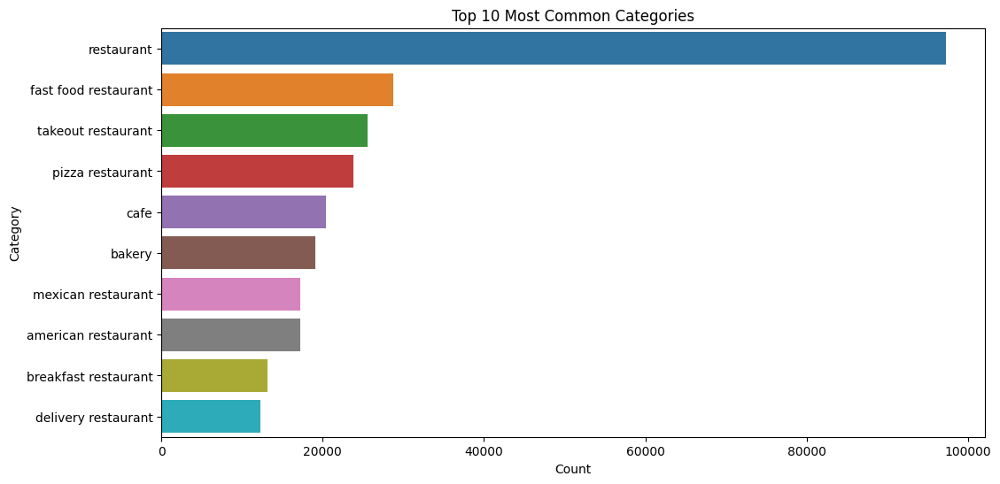

In [25]:
# Visualizo la distribución de las categorías usando gráficos de barras
plt.figure(figsize=(12, 6))
sns.countplot(data=df_filtrado, y='category', order=df_filtrado['category'].value_counts().index[:10])
plt.xlabel('Count')
plt.ylabel('Category')
plt.title('Top 10 Most Common Categories')
plt.show();

In [26]:
# Demasiados datos para poder visualizar el mapa con este codigo paso a hacer bloques del mapa 
'''# Veo la distribucion de latitud y longitud de metadatos gmaps

# Creo un mapa de Folium 
mapa = folium.Map(location=[df_filtrado['latitude'].mean(), df_filtrado['longitude'].mean()], zoom_start=4)

for index, row in df_filtrado.iterrows():
    folium.Marker([row['latitude'], row['longitude']], tooltip=row['name']).add_to(mapa)

# Guardo el mapa como un archivo HTML
mapa.save('mapa_estatico.html')'''


"# Veo la distribucion de latitud y longitud de metadatos gmaps\n\n# Creo un mapa de Folium \nmapa = folium.Map(location=[df_filtrado['latitude'].mean(), df_filtrado['longitude'].mean()], zoom_start=4)\n\nfor index, row in df_filtrado.iterrows():\n    folium.Marker([row['latitude'], row['longitude']], tooltip=row['name']).add_to(mapa)\n\n# Guardo el mapa como un archivo HTML\nmapa.save('mapa_estatico.html')"

In [27]:
# El codigo anterior no me muestra el mapa por la cantidad de los datos, se genera por bloques para poder visualizar el resultado

tamaño_del_bloque = 1000

# Calculo la cantidad total de bloques que necesitas
total_de_bloques = len(df_filtrado) // tamaño_del_bloque + 1

# Directorio donde se guardarán los mapas estáticos
directorio_salida = 'mapas_estaticos/'

# Itero a través de los bloques de datos y genera mapas estáticos
for i in range(total_de_bloques):
    inicio = i * tamaño_del_bloque
    fin = inicio + tamaño_del_bloque
    bloque = df_filtrado.iloc[inicio:fin]

    mapa = folium.Map(location=[bloque['latitude'].mean(), bloque['longitude'].mean()], zoom_start=4)

    for index, row in bloque.iterrows():
        folium.Marker([row['latitude'], row['longitude']], tooltip=row['name']).add_to(mapa)

    # Guardo el mapa como un archivo HTML en el directorio de salida
    nombre_archivo = f'mapa_estatico_bloque_{i}.html'
    mapa.save(directorio_salida + nombre_archivo)

In [37]:
# Creo un mapa centrado en una ubicación específica
mapa_calor = folium.Map(location=[df_filtrado['latitude'].mean(), df_filtrado['longitude'].mean()], zoom_start=4)

# Convierto las coordenadas de latitud y longitud en una lista de puntos
coordenadas = df_filtrado[['latitude', 'longitude']].values.tolist()

# Agrego una capa de mapa de calor
HeatMap(coordenadas).add_to(mapa_calor)

# Guarda el mapa de calor como un archivo HTML
mapa_calor.save('mapa_calor.html')


In [38]:
mapa_calor

<p align="center">
  <img src="https://i.ibb.co/0XZ1yYg/mapa-calor2.png" height="300">
</p>

<p align="center">
  <img src="https://i.ibb.co/R2b9QtM/mapa-calor1.png" height="300">
</p>

Tenemos ubicaciones fuera de estados unidos las mismas seran eliminadas ya que no representan un gran porcentaje de los datos que manejamos.

In [ ]:
# Voy a eliminar las filas que esten fuera de estados unidos 
# Defino los límites geográficos de los Estados Unidos
latitud_min = 24.396308
latitud_max = 49.384358
longitud_min = -125.000000
longitud_max = -66.934570

# Filtro lugares dentro de los límites geográficos de los Estados Unidos
us_places = df_filtrado[(df_filtrado['Latitude'] >= latitud_min) &
               (df_filtrado['Latitude'] <= latitud_max) &
               (df_filtrado['Longitude'] >= longitud_min) &
               (df_filtrado['Longitude'] <= longitud_max)]

# Mostro los lugares dentro de los Estados Unidos
print(us_places)

In [ ]:
# Asigno el resultado del filtrado nuevamente a df_filtrado para actualizarlo
df_filtrado = us_places

In [28]:
# Genero funcion para ver las variables numericas
def estadisticos_cont(num):
    #Calculo describe
    estadisticos = num.describe().T
    #Añado la mediana
    estadisticos['median'] = num.median()
    #Reordeno para que la mediana esté al lado de la media
    estadisticos = estadisticos.iloc[:,[0,1,8,2,3,4,5,6,7]]
    return(estadisticos)

In [29]:
estadisticos_cont(df_filtrado.select_dtypes('number'))

,count,mean,median,std,min,25%,50%,75%,max
latitude,441868.0,37.437398,38.635843,5.338922,8.750457,33.808366,38.635843,41.087240,71.292018
longitude,441868.0,-91.853317,-86.748644,17.266543,-177.378634,-99.501736,-86.748644,-77.779019,180.000000
avg_rating,441868.0,4.122160,4.200000,0.576942,1.000000,3.800000,4.200000,4.500000,5.000000
num_of_reviews,441868.0,142.959228,48.000000,356.960660,1.000000,18.000000,48.000000,108.000000,9998.000000


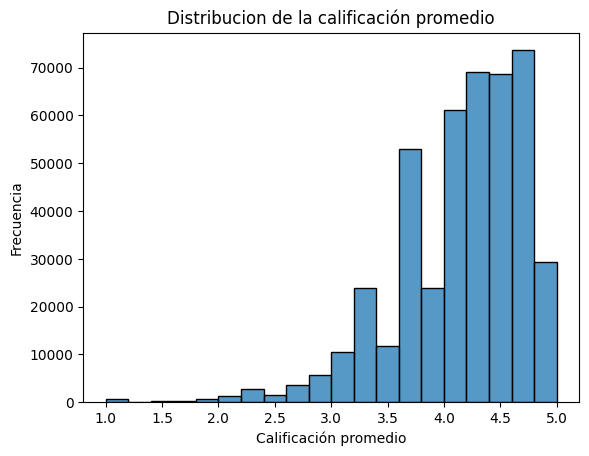

In [30]:
# Histograma para la columna 'avg_rating'
sns.histplot(data=df_filtrado, x='avg_rating', bins=20)
plt.xlabel('Calificación promedio')
plt.ylabel('Frecuencia')
plt.title('Distribucion de la calificación promedio')
plt.show();

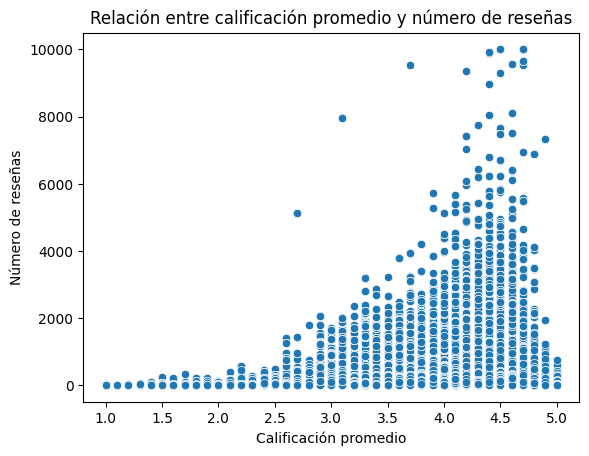

In [31]:
# Gráfico de dispersión entre 'avg_rating' y 'num_of_reviews'
sns.scatterplot(data=df_filtrado, x='avg_rating', y='num_of_reviews')
plt.xlabel('Calificación promedio')
plt.ylabel('Número de reseñas')
plt.title('Relación entre calificación promedio y número de reseñas')
plt.show();


In [32]:
# Exporto df_filtrado para probar union por latitud y longitud con la base de yeld
df_filtrado.to_csv('gmaps_filtrado.csv')